# Visualize LDA results

## Imports

In [1]:
%load_ext autoreload

In [2]:
%autoreload

In [3]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats

import os
from skin_ilc_util import cm_topic, cm_purple_scatter, mpl_set_default_style, power_cmap, \
    day_palette, subplots_fixed_width, day_palette_light, annotate
mpl_set_default_style(matplotlib.rcParams)

# Load data

In [4]:
data_dir = os.path.join('.', 'data')
adata_variable_fname = os.path.join(data_dir, 'sct_variable.h5ad')
adata_full_fname = os.path.join(data_dir, 'sct.h5ad')

In [5]:
adata = sc.read(adata_variable_fname)
adata_full = sc.read(adata_full_fname)

## Load CountClust results

Use normalized SCT data to plot genes

In [6]:
adata.X = adata.layers['norm_data']
adata_full.X = adata_full.layers['norm_data']

In [7]:
k = 17
pointsize = 10
mpl_set_default_style(matplotlib.rcParams)

Rename the topics

In [8]:
reorder = {
              10 : 1,
              16 : 2,
              14 : 3,
              12 : 4,
              8 : 5,
              9 : 6,
              15 : 7,
              17 : 17
          }

reorder_str = {}

topic_range = set(np.arange(1, k + 1))
rest_dict = dict(zip(sorted(topic_range.difference(reorder.keys())), sorted(topic_range.difference(reorder.values()))))
reorder.update(rest_dict)
new_dict = {}
for i in reorder.keys():
    new_dict['lda_{}'.format(i)] = 'lda_{}'.format(reorder[i])
reorder_str = new_dict

Below, `usage` holds topic weights for each cell, `theta` holds gene weights for each topic, and `scores` holds KL based scores of gene importance per topic.

Extract usage and scores, change source if CountClust was re-run locally.

In [9]:
#folder = os.path.join(data_dir, 'CountClust', f'{k}topics_tol0.1')
folder = os.path.join(data_dir, 'CountClust_precomputed', f'{k}topics_tol0.1')

In [10]:
usage = pd.read_csv(os.path.join(folder, "usage.csv"))

usage.rename(columns = {"Unnamed: 0" : "cell_id"}, inplace = True)
usage.set_index("cell_id", inplace = True)
usage.rename(columns = reorder_str, inplace = True)

# Reorder usages
usage = usage.reindex(['lda_{}'.format(i) for i in np.arange(1, k + 1)], axis = 1)
usage.to_csv(os.path.join(folder, "usage_reordered.csv"))

# Drop old ones
lda_cols = [x for x in adata.obs.columns if x.startswith('lda')]
adata.obs.drop(columns = lda_cols, inplace = True)
lda_cols = [x for x in adata_full.obs.columns if x.startswith('lda')]
adata_full.obs.drop(columns = lda_cols, inplace = True)

# Add to adata objects, save
adata.obs = adata.obs.join(usage)
adata_full.obs = adata_full.obs.join(usage)
adata.write(adata_variable_fname)
adata_full.write(adata_full_fname)

In [11]:
topic_range = np.arange(1, k + 1)
topic_list = ["lda_{}".format(topic) for topic in topic_range]

In [12]:
# Load theta
theta = pd.read_csv(os.path.join(folder, "theta.csv"), index_col = 0)

# Reorder theta
rename_genes = {'Cre' : 'Cre (Il5)', 'cre' : 'Cre (Il5)'}
theta.rename(columns = reorder_str, inplace = True)
theta = theta.reindex(['lda_{}'.format(i) for i in np.arange(1, k + 1)], axis = 1)
theta.index.name = "gene"
theta.rename(index = rename_genes, inplace = True)
theta.to_csv(os.path.join(folder, "theta_reorderd.csv"))

In [13]:
scores = pd.read_csv(os.path.join(folder, "score_min.csv"))
scores.rename(columns = {"Unnamed: 0" : "topic"}, inplace = True)
scores.set_index("topic", inplace = True)

# Reorder scores
scores.rename(index = reorder, inplace = True)
scores = scores.reindex(np.arange(1, k + 1))

# Save
scores.to_csv(os.path.join(folder, "score_min_reordered.csv"))

Prepare dictionaries with sorted scores

In [14]:
n_genes = 25
n_features = 200
prolif_topic = 'lda_17'
prolif_cutoff = 0.08

topic_score_dict = {}
plot_score_dict = {}

for (j, topic) in enumerate(topic_range):
    topic_scores = scores.loc[topic,:]

    topic_dict = {}
    for i in np.arange(1, n_features + 1):
        gene_index = int(topic_scores.loc[f"indices.{i}"]) - 1
        gene = theta.index[gene_index]
        score = topic_scores.loc[f"scores.{i}"]
        topic_dict[gene] = score

    topic_series = pd.Series(topic_dict)
    topic_score_dict[topic] = topic_series

    plot_series = topic_series.sort_values(ascending = False).head(n_genes)
    plot_score_dict[topic] = plot_series

## Plots

### Score bar plots

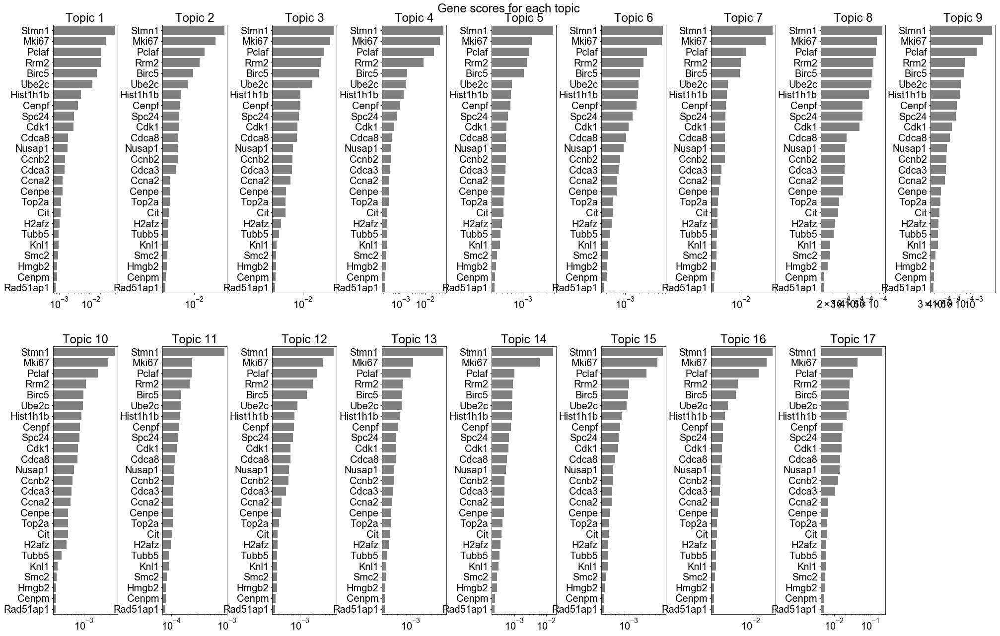

In [15]:
# Axes objects for bar plots
fig, axarr = plt.subplots(figsize=(2*len(topic_range), 20), ncols = int(np.ceil(len(topic_range)/2)), nrows = 2)
axarr = axarr.flatten()

for (j, topic) in enumerate(topic_range):
    ax = axarr[j]
    sns.barplot(y = plot_series.index, x = plot_score_dict[topic].values, color = "gray", label = "Score", ax = ax)
    ax.set(xscale = 'log')
    ax.set_title("Topic {}".format(topic))
axarr[-1].set_visible(False)
fig.suptitle('Gene scores for each topic')
fig.subplots_adjust(wspace = 0.7, top = 0.95)

### Topic weights

In [16]:
adata_restr = adata_full[adata.obs[prolif_topic] <= prolif_cutoff]

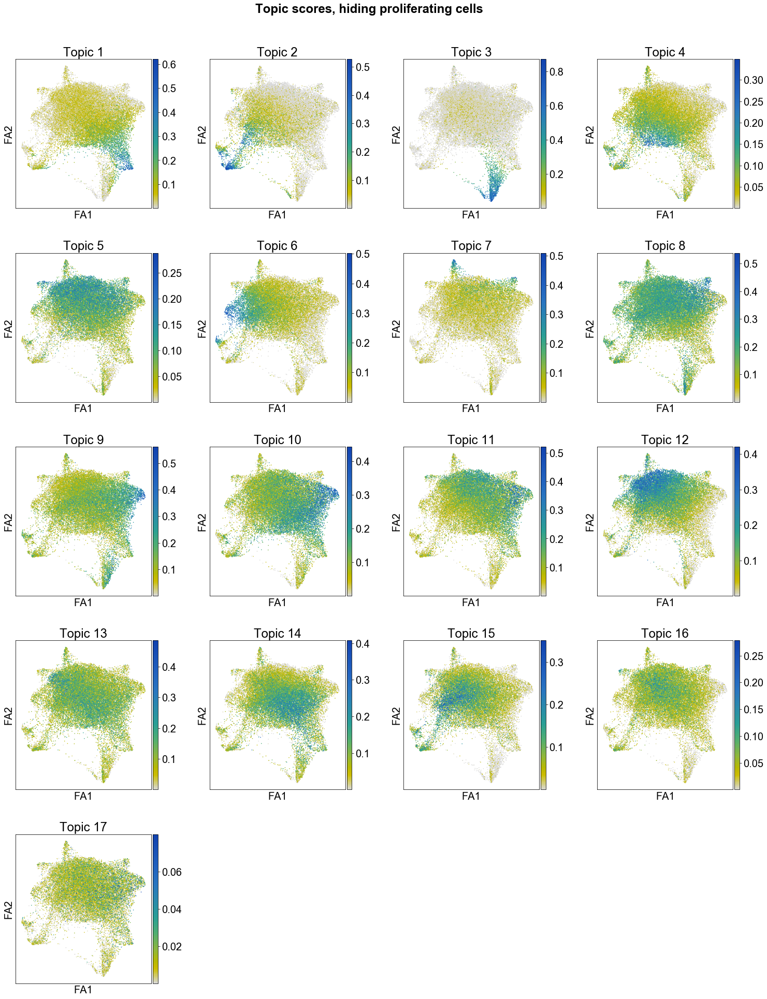

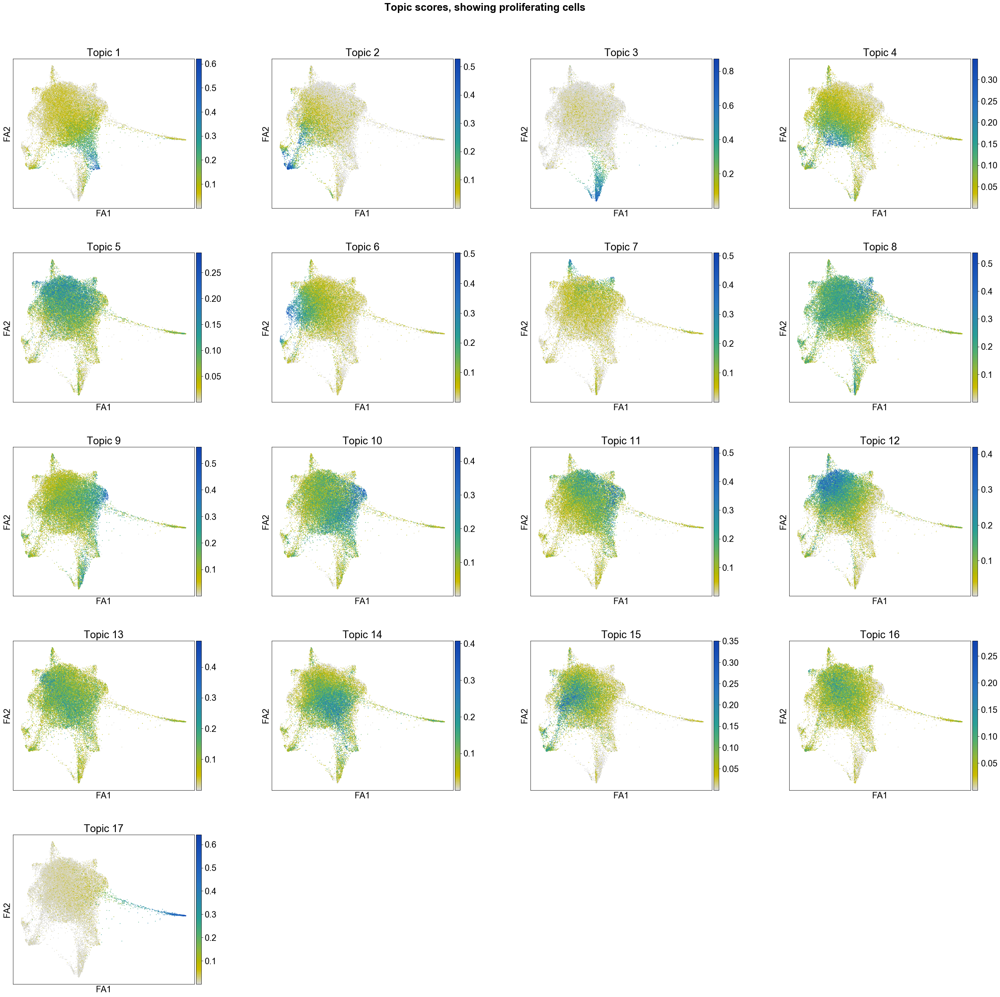

In [17]:
for show_prolif in [False, True]:
    # Adjust figure size
    if show_prolif:
        figsize = (6.4, 4.8)
        adata_plot = adata_full
    else:
        figsize = (4, 4)
        adata_plot = adata_restr

    fig, axes = subplots_fixed_width(5, 4, figsize = figsize, top = 0.93, hspace = 0.3, wspace = 0.3)
    for topic, ax in zip(topic_list, axes.flatten()):
        sc.pl.draw_graph(adata_plot, color = topic,
            cmap = cm_topic, s = pointsize, ax = ax, show = False, title = f'Topic {topic[4:]}')
        title_str = f'Topic scores, '
        title_str += 'showing proliferating cells' if show_prolif else 'hiding proliferating cells'
        fig.suptitle(title_str, weight = 'bold')
    
    for i in range(17, 20):
        axes.flatten()[i].set_visible(False)

### Topic genes

In [18]:
selected_genes = {
    1 : ['Fos', 'Klf6', 'Zfp36l2', 'Tsc22d3'],
    2 : ['Cxcl2', 'Ccl1', 'Il1rl1', 'Cre (Il5)'],
    3 : ['Gzmb', 'Il17a', 'Il1r1', 'Il23r'],
    4 : ['Areg', 'Il2', 'Tnfsf9', 'Nr4a2'],
    5 : ['Icos', 'Cxcr6', 'Il21r', 'Hlf'],
    6 : ['Hopx', 'Tff1', 'Cd70', 'Tnfrsf4'],
    7 : ['Ccl5', 'Cxcl10', 'Ms4a4b', 'H2-Aa'],
}

cm_adjustments = {
    'Tsc22d3' : 1.5,
    'Fos' : 2.0,
    'Klf6' : 2.0,
    'Zfp36l2' : 2.5,
    'Cre (Il5)' : 1.5,
    'Areg' : 2.0,
    'Il2' : 1.5,
    'Tnfsf9' : 1.5,
    'Nr4a2' : 2.5,
    'Icos' : 2.0,
    'Cxcr6' : 2.0,
    'Hlf' : 3.0,
}

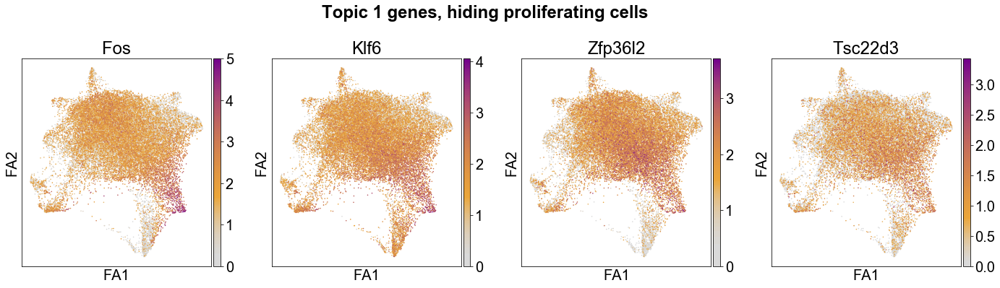

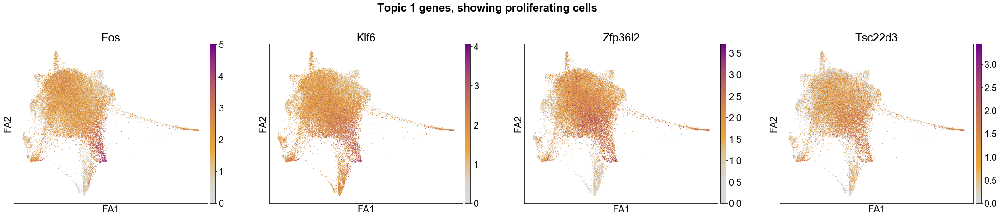

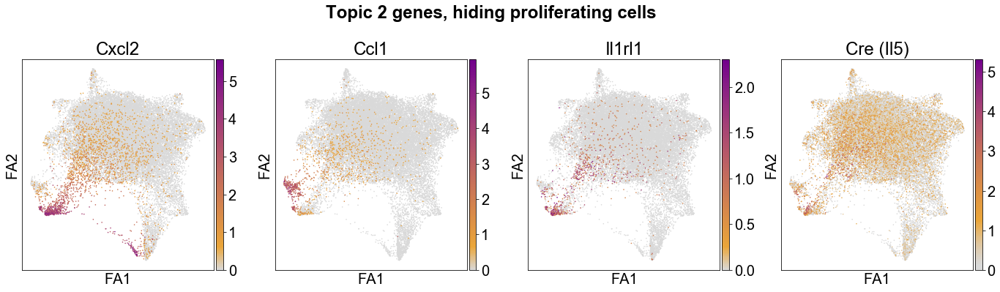

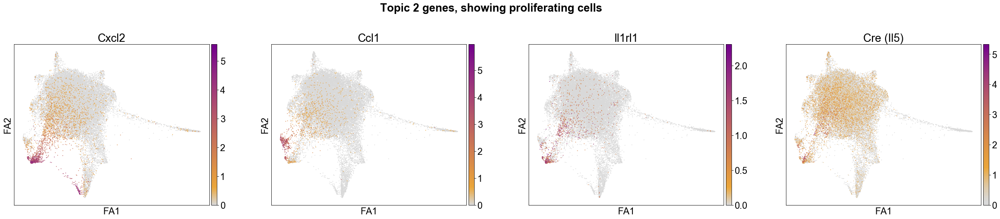

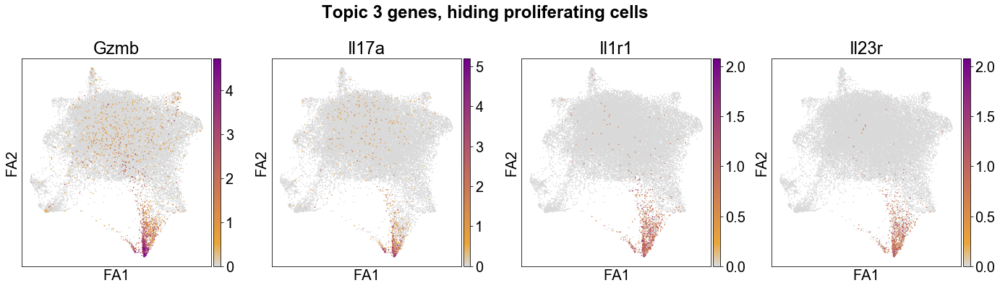

...

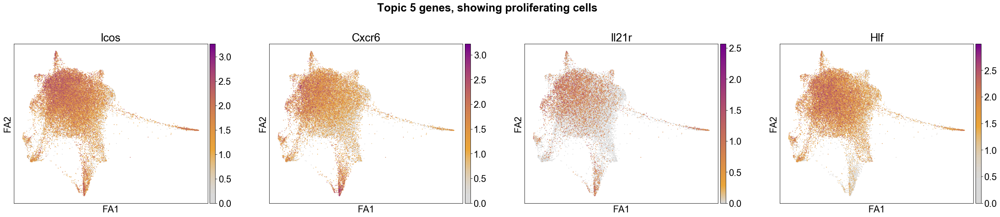

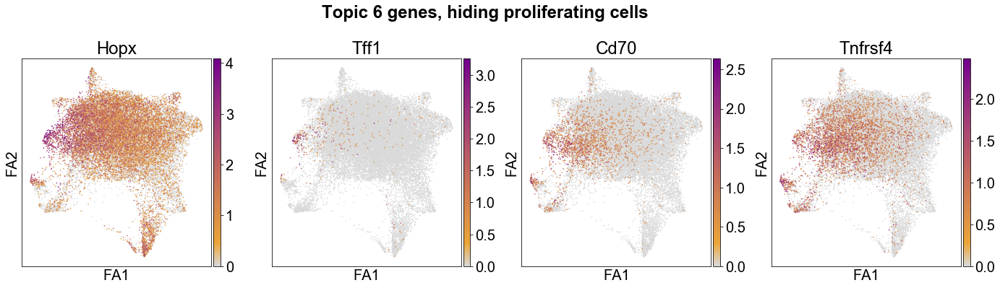

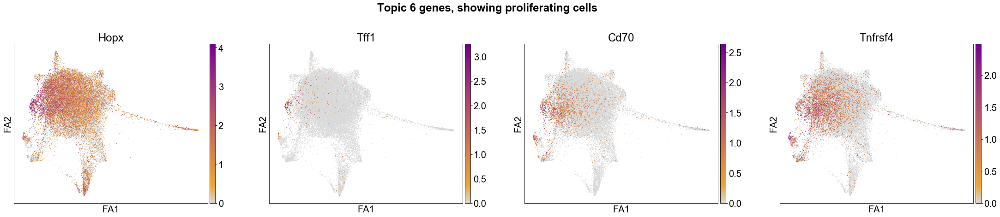

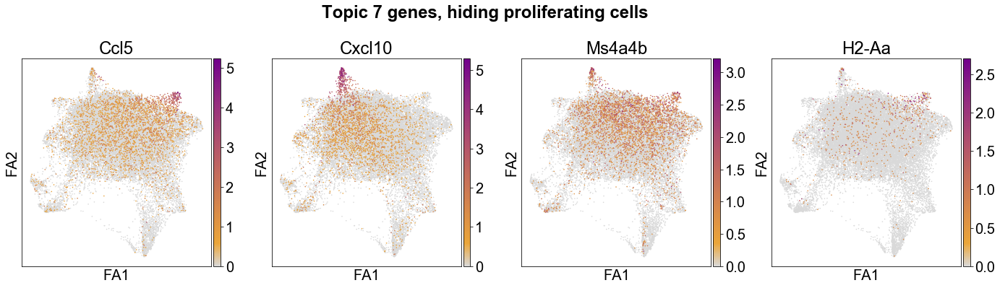

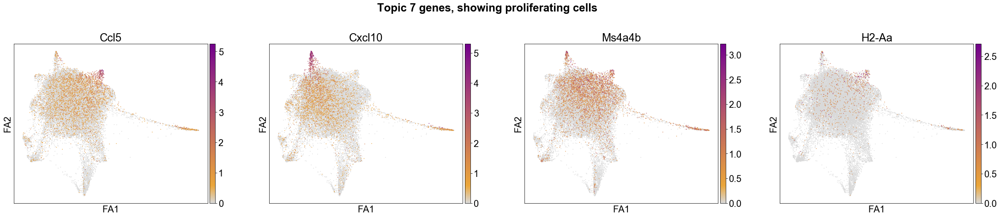

In [19]:
for topic, genes in selected_genes.items():
    for show_prolif in [False, True]:
        # Adjust figure size
        if show_prolif:
            figsize = (6.4, 4.8)
            adata_plot = adata_full
        else:
            figsize = (4, 4)
            adata_plot = adata_restr

        fig, axes = subplots_fixed_width(1, 4, figsize = figsize, top = 0.8)
        for j, gene in enumerate(genes):
            power = cm_adjustments.get(gene, 1.0)
            sc.pl.draw_graph(adata_plot, color = gene,
                            cmap = power_cmap(cm_purple_scatter, power), s = pointsize, ax = axes[j], show = False)
            ax.title.set_fontstyle('italic')
        title_str = f'Topic {topic} genes, '
        title_str += 'showing proliferating cells' if show_prolif else 'hiding proliferating cells'
        fig.suptitle(title_str, weight = 'bold')

### Cumulative distribution functions

In [20]:
def calc_cutoffs(df, col_var, sel_var, bar_select = 6):
    # Precalculate quantiles
    cutoffs = {}
    for col in df[col_var].unique():
        cutoffs[col] = float(df.query(f'{col_var} == "{col}"').groupby(sel_var).\
                              agg(lambda x: np.percentile(x, 100*(1 - 2**(-bar_select)))).max())
    return cutoffs

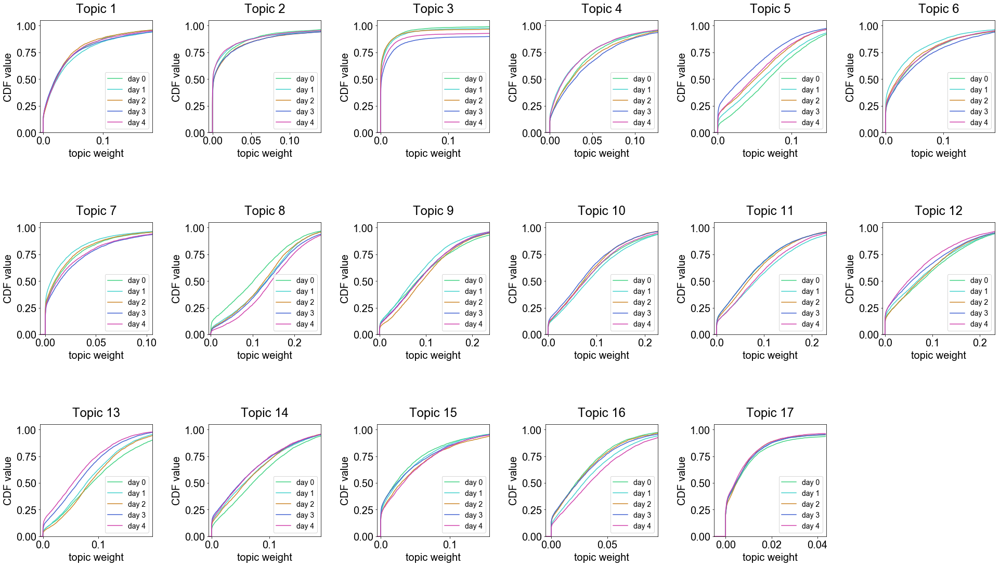

In [21]:
day_selection = [0,1,2,3,4]
figsize = (3, 3)
num_bins = 2000
bins = np.linspace(0, 1, num_bins)
cutoff_quantile = 0.95
add_zero = True
left_extension = 0.005
n_add = 20
    
fig_combined, axes = subplots_fixed_width(3, 6, figsize = figsize,
                                          hspace = 0.8, wspace = 0.5, left = 0.1, right = 0.9)

for topic_index, topic in enumerate(topic_list):
    df = adata.obs[['day', topic]]
    
    # Calculate cut-off
    cut_off = np.quantile(df[topic], cutoff_quantile)
    
    for i, day in enumerate(day_selection):
        counts, bin_edges = np.histogram(df[df['day'] == str(day)][topic], bins=bins, density=True)
        cdf = np.cumsum(counts)
        color = day_palette[day]
            
        cdf = cdf/cdf[-1]
        x = bin_edges[:-1]
        sel = x <= cut_off
        cdf = cdf[sel]
        x = x[sel]
        
        if add_zero:
            x_add = np.linspace(-left_extension, 0, n_add)
            cdf_add = np.zeros(n_add)
            x = np.hstack([x_add, x])
            cdf = np.hstack([cdf_add, cdf])
        
        ax = axes.flatten()[topic_index]
        ax.plot(x, cdf, label = f'day {day}', color = color)
        if add_zero:
            ax.set_ylim([0,1.05])
            ax.set_xlim([-left_extension, cut_off])
        else:
            ax.set_xlim([0, cut_off])
        ax.set_xlabel('topic weight', labelpad = 5)
        ax.set_ylabel('CDF value', labelpad = 5)
        ax.legend(loc = 'lower right', prop = {'size' : 14})
        ax.set_title(f'Topic {topic[4:]}', pad = 15)

for topic_index2 in range(topic_index + 1, axes.size):
    fig_combined.delaxes(axes.flatten()[topic_index2])

### Enhanced box plots

In [22]:
df = adata.obs[['day'] + topic_list]
df.reset_index(inplace = True)

In [23]:
dfm = df.melt(id_vars = ['index', 'day'], var_name = 'Topic', value_name = 'Weight')

Calculate p-values.

In [24]:
pvals = {}
total_length = len(topic_list) * 2

for topic in topic_list:
    pval_res = []
    for target in ['1', '3']:
        pval_res.append(np.clip(scipy.stats.mannwhitneyu(dfm.query(f'Topic == "{topic}" & day == "0"')['Weight'],
                                 dfm.query(f'Topic == "{topic}" & day == "{target}"')['Weight'],
                                 alternative = 'two-sided')[1] * total_length, a_min = None, a_max = 1))
    pvals[topic] = pval_res

In [25]:
cutoffs = calc_cutoffs(dfm, col_var = 'Topic', sel_var = 'day', bar_select = 5)
reject_thresh = 0.01

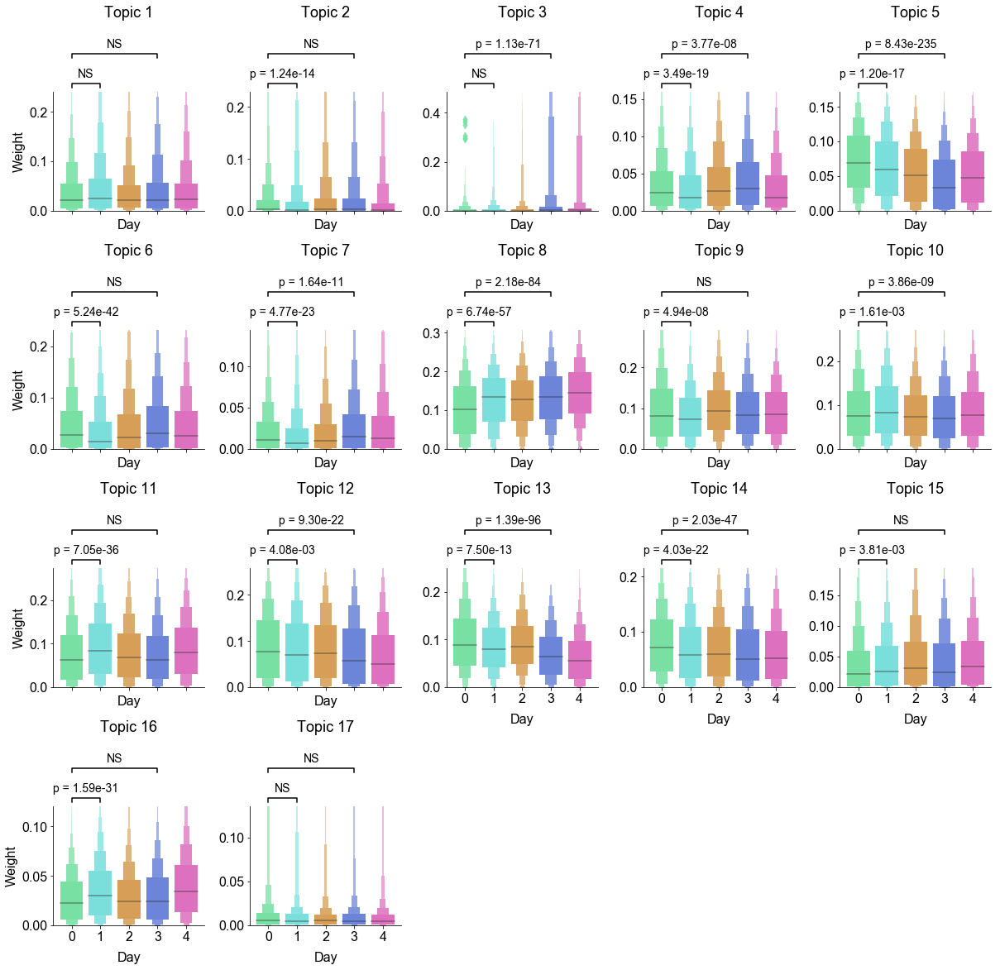

In [26]:
percentiles = {'lda_3' : 97}
g = sns.catplot(x = 'day', y = 'Weight', col = 'Topic', data = dfm, col_wrap = 5, kind = 'boxen', sharey = False,
                aspect = 0.9, height = 3.5,
                palette = day_palette_light,
                linewidth = 1.5,
               )
for ax_combined, t in zip(g.axes, topic_list):
    for ax in [ax_combined]:
        ax.set_title(f'Topic {t[4:]}', pad = 90)
        ax.set_xlabel('Day')
        ax.title.set_fontsize(18)
        ax.xaxis.get_label().set_fontsize(16)
        ax.yaxis.get_label().set_fontsize(16)
        ax.xaxis.labelpad = 10
        ax.tick_params(labelsize = 16)
        ax.set_ylim([0.0, cutoffs[t]])
        
        pval0_text = f'p = {pvals[t][0]:.2e}' if pvals[t][0] < reject_thresh else 'NS'
        pval1_text = f'p = {pvals[t][1]:.2e}' if pvals[t][1] < reject_thresh else 'NS'
        annotate(ax, 0, 1, pval0_text, text_fact = 0.03)
        annotate(ax, 0, 3, pval1_text, y_fact = 0.28, text_fact = 0.03)
        
        for i in range(0, len(ax.collections), 2):
            ax.collections[i].set_facecolor((*(ax.collections[i].get_facecolor()[0][:3]), 0.8))
g.fig.subplots_adjust(hspace = 1.0, wspace = 0.3, top = 1, bottom = 0, left = 0, right = 1)

# BIC plot

In [27]:
df = pd.read_csv(os.path.join(data_dir, 'CountClust_precomputed', 'bic.csv'))

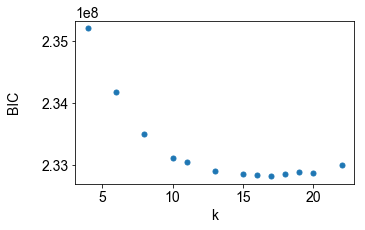

In [28]:
fontsize = 14
df.set_index('k')
fig, ax = plt.subplots(figsize = (5,3))
df.plot(x = 'k', y = 'BIC', marker = '.', ax = ax, kind = 'scatter', s = 100, linewidth = 1)
ax.set_ylabel('BIC', labelpad = 20)
ax.tick_params(labelsize = fontsize)
ax.xaxis.label.set_fontsize(fontsize)
ax.yaxis.label.set_fontsize(fontsize)
ax.yaxis.offsetText.set_fontsize(fontsize)